In [1]:
import pandas as pd
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [2]:

df = pd.read_csv("credit card.csv")
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [3]:
df.shape

(30000, 25)

In [4]:
df.isnull().sum()

ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default.payment.next.month    0
dtype: int64

In [5]:

df.nunique()

ID                            30000
LIMIT_BAL                        81
SEX                               2
EDUCATION                         7
MARRIAGE                          4
AGE                              56
PAY_0                            11
PAY_2                            11
PAY_3                            11
PAY_4                            11
PAY_5                            10
PAY_6                            10
BILL_AMT1                     22723
BILL_AMT2                     22346
BILL_AMT3                     22026
BILL_AMT4                     21548
BILL_AMT5                     21010
BILL_AMT6                     20604
PAY_AMT1                       7943
PAY_AMT2                       7899
PAY_AMT3                       7518
PAY_AMT4                       6937
PAY_AMT5                       6897
PAY_AMT6                       6939
default.payment.next.month        2
dtype: int64

In [6]:

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [7]:
df = df.rename(columns={'default.payment.next.month':'payment'})

In [8]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,payment
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [9]:

x = df.drop(['ID','payment'], axis=1)


In [10]:
y = df[['payment']]

In [11]:

y.value_counts()

payment
0          23364
1           6636
dtype: int64

In [12]:
23364 / (23364+6636)

0.7788

In [ ]:
Wrapper Method - Recursive Feature Elimination (RFE) in Python

Wrapper methods in feature selection involve evaluating different subsets of features by training and evaluating a machine learning model. You can perform wrapper feature selection using a simple wrapper method called Recursive Feature Elimination (RFE) in Python.

In [13]:

from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [14]:
# Create an instance of the classifier
classifier = LogisticRegression()

In [15]:
# Create an instance of Recursive Feature Elimination with logistic regression
rfe = RFE(estimator=classifier, n_features_to_select=10)

#rfe Will calculate the rank of the features based on score where rank=1 means more important.
#n_features_to_select=10 means based on the ranks, the top features will be selected according to the given number. In this ca

In [ ]:
Fit RFE to your data

In [16]:

rfe.fit(x, y)

RFE(estimator=LogisticRegression(), n_features_to_select=10)

In [17]:

# Print the selected features
selected_features = rfe.support_ #The support_ attribute typically represents a Boolean mask indicating which features are selected or supported by the RFE algorithm.
feature_ranks = rfe.ranking_

In [18]:

feature_ranks

array([ 8,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  9, 14, 11, 12,  7, 13,
        2,  3,  6,  4,  5, 10])

In [19]:
# Print the selected features and their ranks
for feature, rank in zip(x.columns, feature_ranks):
    print(f'Feature: {feature}, Rank: {rank}')

Feature: LIMIT_BAL, Rank: 8
Feature: SEX, Rank: 1
Feature: EDUCATION, Rank: 1
Feature: MARRIAGE, Rank: 1
Feature: AGE, Rank: 1
Feature: PAY_0, Rank: 1
Feature: PAY_2, Rank: 1
Feature: PAY_3, Rank: 1
Feature: PAY_4, Rank: 1
Feature: PAY_5, Rank: 1
Feature: PAY_6, Rank: 1
Feature: BILL_AMT1, Rank: 9
Feature: BILL_AMT2, Rank: 14
Feature: BILL_AMT3, Rank: 11
Feature: BILL_AMT4, Rank: 12
Feature: BILL_AMT5, Rank: 7
Feature: BILL_AMT6, Rank: 13
Feature: PAY_AMT1, Rank: 2
Feature: PAY_AMT2, Rank: 3
Feature: PAY_AMT3, Rank: 6
Feature: PAY_AMT4, Rank: 4
Feature: PAY_AMT5, Rank: 5
Feature: PAY_AMT6, Rank: 10


In [20]:

rfe.score(x,y)

0.8099

In [ ]:
Embedded Methods - L1 regularization (Lasso)

In [22]:
# Create an instance of the classifier with L1 regularization (Lasso)

classifier = LogisticRegression(penalty='l1', solver='liblinear')

# Fit the classifier to your data
classifier.fit(x, y)  # x/X_train: Input features, y/y_train: Target variable

# Retrieve the coefficients (weights) of the features
coefficients = classifier.coef_

In [23]:
# Print the coefficients and corresponding feature names
for feature, coefficient in zip(x.columns, coefficients[0]):
    print(f'Feature: {feature}, Coefficient: {coefficient}')

#negative coefficient means inverse relationship where positive coefficient means good relationship.

Feature: LIMIT_BAL, Coefficient: -7.667569665236244e-07
Feature: SEX, Coefficient: -0.11018671401412056
Feature: EDUCATION, Coefficient: -0.10202518287861284
Feature: MARRIAGE, Coefficient: -0.15701847765511026
Feature: AGE, Coefficient: 0.007231256976099899
Feature: PAY_0, Coefficient: 0.57712783233472
Feature: PAY_2, Coefficient: 0.0826912194349955
Feature: PAY_3, Coefficient: 0.0720914734721216
Feature: PAY_4, Coefficient: 0.023849840203453654
Feature: PAY_5, Coefficient: 0.033962062884324136
Feature: PAY_6, Coefficient: 0.008001556530846981
Feature: BILL_AMT1, Coefficient: -5.461472107067066e-06
Feature: BILL_AMT2, Coefficient: 2.3012540693878653e-06
Feature: BILL_AMT3, Coefficient: 1.3952547927606317e-06
Feature: BILL_AMT4, Coefficient: -1.9013043217336141e-07
Feature: BILL_AMT5, Coefficient: 6.188734577134833e-07
Feature: BILL_AMT6, Coefficient: 3.952335155093676e-07
Feature: PAY_AMT1, Coefficient: -1.3608594954015686e-05
Feature: PAY_AMT2, Coefficient: -9.649937868262175e-06
Fea

In [ ]:
Filter Methods - Extra Trees Classifier

Extra Trees Classifier is mainly Information Gain value. (Ensemble Machine Learning Technique)

In [24]:

from sklearn.ensemble import ExtraTreesClassifier # Decison tree

In [25]:
extr = ExtraTreesClassifier()

In [26]:

extr.fit(x,y)

ExtraTreesClassifier()

In [27]:
extr.feature_importances_ # IG from decision tree

array([0.06571026, 0.01180124, 0.03278008, 0.02051702, 0.06648554,
       0.09570386, 0.048681  , 0.03490023, 0.03051333, 0.02973523,
       0.02946195, 0.05018709, 0.04685543, 0.04554951, 0.04459116,
       0.04334165, 0.04439559, 0.04369103, 0.04237411, 0.04236136,
       0.04111536, 0.04270354, 0.04654444])

In [28]:
feature_importance = extr.feature_importances_
feature_importance #info gain

array([0.06571026, 0.01180124, 0.03278008, 0.02051702, 0.06648554,
       0.09570386, 0.048681  , 0.03490023, 0.03051333, 0.02973523,
       0.02946195, 0.05018709, 0.04685543, 0.04554951, 0.04459116,
       0.04334165, 0.04439559, 0.04369103, 0.04237411, 0.04236136,
       0.04111536, 0.04270354, 0.04654444])

In [29]:
imp = pd.DataFrame(feature_importance, columns=['Gain_Score'])
imp
     

,Gain_Score
0,0.065710
1,0.011801
2,0.032780
3,0.020517
4,0.066486
5,0.095704
6,0.048681
7,0.034900
8,0.030513
9,0.029735


In [30]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [31]:

cols = pd.DataFrame(x.columns, columns=['Feature_Names'])
cols
     

,Feature_Names
0,LIMIT_BAL
1,SEX
2,EDUCATION
3,MARRIAGE
4,AGE
5,PAY_0
6,PAY_2
7,PAY_3
8,PAY_4
9,PAY_5


In [32]:

gains = pd.concat([cols,imp],axis=1)
gains

,Feature_Names,Gain_Score
0,LIMIT_BAL,0.065710
1,SEX,0.011801
2,EDUCATION,0.032780
3,MARRIAGE,0.020517
4,AGE,0.066486
5,PAY_0,0.095704
6,PAY_2,0.048681
7,PAY_3,0.034900
8,PAY_4,0.030513
9,PAY_5,0.029735


In [33]:
gains.nlargest(15,'Gain_Score') #largest()

,Feature_Names,Gain_Score
5,PAY_0,0.095704
4,AGE,0.066486
0,LIMIT_BAL,0.065710
11,BILL_AMT1,0.050187
6,PAY_2,0.048681
12,BILL_AMT2,0.046855
22,PAY_AMT6,0.046544
13,BILL_AMT3,0.045550
14,BILL_AMT4,0.044591
16,BILL_AMT6,0.044396


In [34]:
gains.nsmallest(8,'Gain_Score') #smallest()

,Feature_Names,Gain_Score
1,SEX,0.011801
3,MARRIAGE,0.020517
10,PAY_6,0.029462
9,PAY_5,0.029735
8,PAY_4,0.030513
2,EDUCATION,0.032780
7,PAY_3,0.034900
20,PAY_AMT4,0.041115


In [35]:

newx = gains.nlargest(18,'Gain_Score')
newx
     

,Feature_Names,Gain_Score
5,PAY_0,0.095704
4,AGE,0.066486
0,LIMIT_BAL,0.065710
11,BILL_AMT1,0.050187
6,PAY_2,0.048681
12,BILL_AMT2,0.046855
22,PAY_AMT6,0.046544
13,BILL_AMT3,0.045550
14,BILL_AMT4,0.044591
16,BILL_AMT6,0.044396


<Axes: >

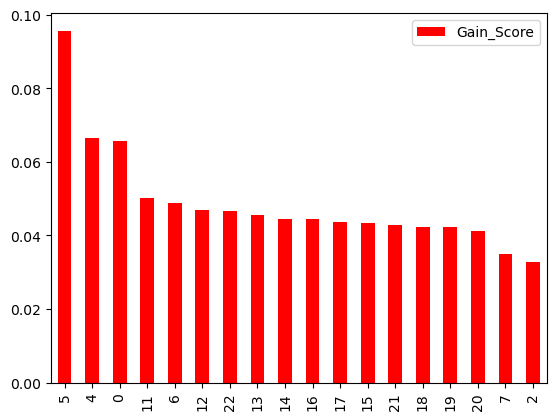

In [36]:

#Vertical bar chart

newx.plot(kind='bar',color=['red']) # bar means vertical, barh mean horizontal

In [37]:
x.shape

(30000, 23)

In [38]:

import matplotlib.pyplot as plt

<Axes: >

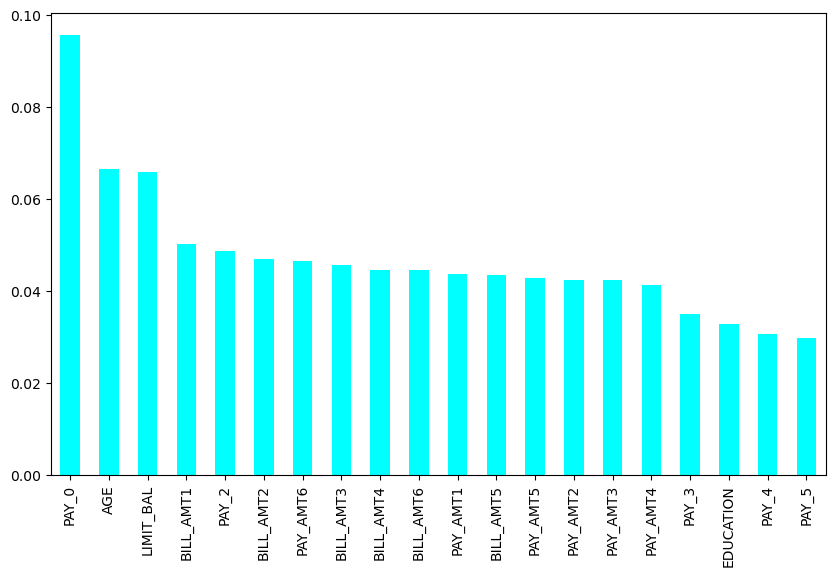

In [39]:
#Series Plot

features = pd.Series(extr.feature_importances_, index = x.columns)
plt.figure(figsize=(10,6))
features.nlargest(20).plot(kind='bar', color='cyan')
#plt.savefig('score1.png')
     

<Axes: >

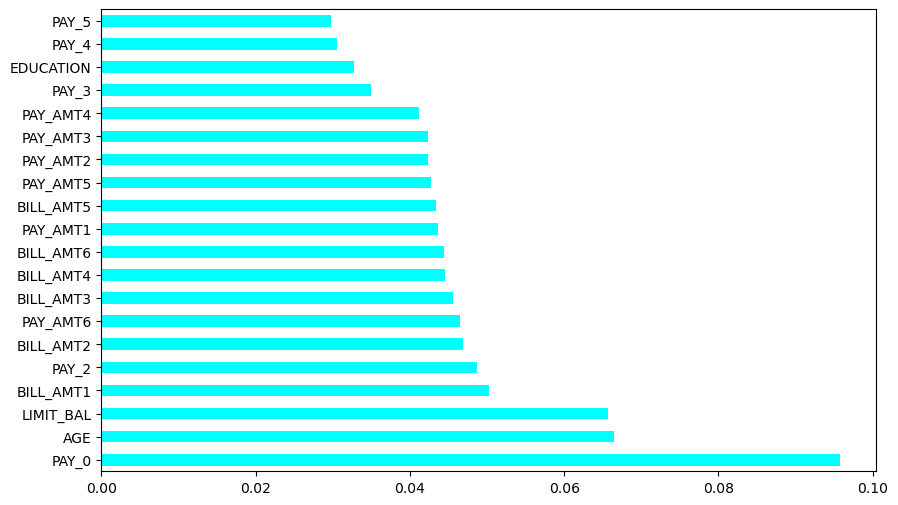

In [40]:
#Horizontal bar chart

features = pd.Series(extr.feature_importances_, index = x.columns)
plt.figure(figsize=(10,6))
features.nlargest(20).plot(kind='barh', color='cyan') #bar=vertical but barh = horizontal
#plt.savefig('score1.png')

In [41]:
#x = newx
x.corr()


,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
LIMIT_BAL,1.000000,0.024755,-0.219161,-0.108139,0.144713,-0.271214,-0.296382,-0.286123,-0.267460,-0.249411,...,0.283236,0.293988,0.295562,0.290389,0.195236,0.178408,0.210167,0.203242,0.217202,0.219595
SEX,0.024755,1.000000,0.014232,-0.031389,-0.090874,-0.057643,-0.070771,-0.066096,-0.060173,-0.055064,...,-0.024563,-0.021880,-0.017005,-0.016733,-0.000242,-0.001391,-0.008597,-0.002229,-0.001667,-0.002766
EDUCATION,-0.219161,0.014232,1.000000,-0.143464,0.175061,0.105364,0.121566,0.114025,0.108793,0.097520,...,0.013002,-0.000451,-0.007567,-0.009099,-0.037456,-0.030038,-0.039943,-0.038218,-0.040358,-0.037200
MARRIAGE,-0.108139,-0.031389,-0.143464,1.000000,-0.414170,0.019917,0.024199,0.032688,0.033122,0.035629,...,-0.024909,-0.023344,-0.025393,-0.021207,-0.005979,-0.008093,-0.003541,-0.012659,-0.001205,-0.006641
AGE,0.144713,-0.090874,0.175061,-0.414170,1.000000,-0.039447,-0.050148,-0.053048,-0.049722,-0.053826,...,0.053710,0.051353,0.049345,0.047613,0.026147,0.021785,0.029247,0.021379,0.022850,0.019478
PAY_0,-0.271214,-0.057643,0.105364,0.019917,-0.039447,1.000000,0.672164,0.574245,0.538841,0.509426,...,0.179785,0.179125,0.180635,0.176980,-0.079269,-0.070101,-0.070561,-0.064005,-0.058190,-0.058673
PAY_2,-0.296382,-0.070771,0.121566,0.024199,-0.050148,0.672164,1.000000,0.766552,0.662067,0.622780,...,0.224146,0.222237,0.221348,0.219403,-0.080701,-0.058990,-0.055901,-0.046858,-0.037093,-0.036500
PAY_3,-0.286123,-0.066096,0.114025,0.032688,-0.053048,0.574245,0.766552,1.000000,0.777359,0.686775,...,0.227494,0.227202,0.225145,0.222327,0.001295,-0.066793,-0.053311,-0.046067,-0.035863,-0.035861
PAY_4,-0.267460,-0.060173,0.108793,0.033122,-0.049722,0.538841,0.662067,0.777359,1.000000,0.819835,...,0.244983,0.245917,0.242902,0.239154,-0.009362,-0.001944,-0.069235,-0.043461,-0.033590,-0.026565
PAY_5,-0.249411,-0.055064,0.097520,0.035629,-0.053826,0.509426,0.622780,0.686775,0.819835,1.000000,...,0.243335,0.271915,0.269783,0.262509,-0.006089,-0.003191,0.009062,-0.058299,-0.033337,-0.023027


In [42]:

x.describe()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,3.000000e+04,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000
mean,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,-0.266200,...,4.701315e+04,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567
std,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,1.133187,...,6.934939e+04,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775
min,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-1.572640e+05,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000
25%,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2.666250e+03,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000
50%,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.008850e+04,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000
75%,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,6.016475e+04,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000
max,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,...,1.664089e+06,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000


In [43]:

 x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

<Axes: >

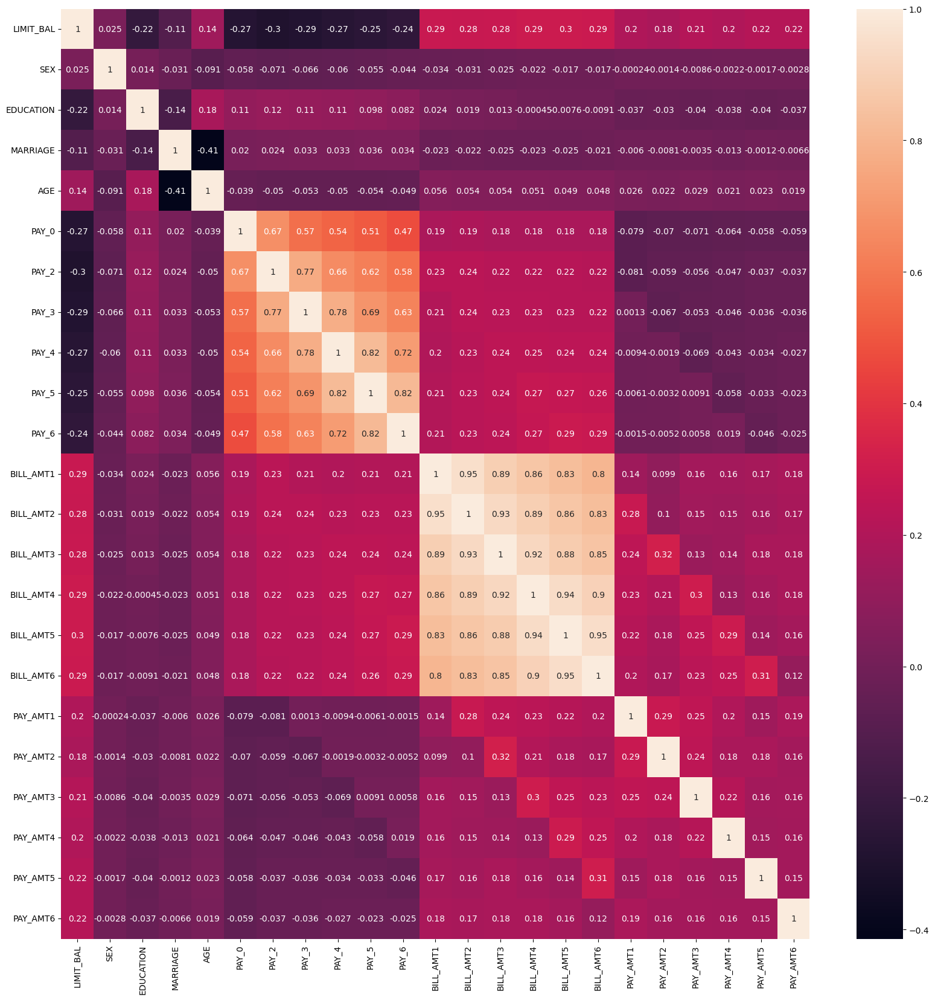

In [44]:
#Heatmap

feature_names = x.columns #features name
colname = x.corr().index #features name
plt.figure(figsize=(20,20))
sns.heatmap(df[colname].corr(),annot=True)

In [ ]:
Select K Best

Score Function is needed like SelectKBest, f_classif, chi2, f_regression.

If it is classification and does not have any negative value, then chi2 can be used. But, if it is classification and has any negative value, then chi2 can not be used. In that case, we can use f_classif.

In [45]:
df = pd.read_csv("credit card.csv")
df = df.rename(columns={'default.payment.next.month':'payment'})
x = df.drop(['ID','payment'],axis=1)
y = df['payment']

In [46]:

x.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0


In [47]:
from sklearn.feature_selection import SelectKBest, f_classif, chi2, f_regression #chi2 only when features are non negative

In [48]:

model2 = SelectKBest(score_func=f_classif)

In [49]:

feature_score = model2.fit(x,y)

In [50]:

feature_score.scores_

array([7.24068539e+02, 4.79788543e+01, 2.35471118e+01, 1.77812714e+01,
       5.78855582e+00, 3.53771497e+03, 2.23916914e+03, 1.75746644e+03,
       1.47684597e+03, 1.30459118e+03, 1.08540249e+03, 1.15805315e+01,
       6.04423789e+00, 5.94438771e+00, 3.09474518e+00, 1.37108740e+00,
       8.65820292e-01, 1.60403810e+02, 1.03291524e+02, 9.52180109e+01,
       9.71880005e+01, 9.14298008e+01, 8.50890453e+01])

In [51]:

cols = pd.DataFrame(feature_score.scores_ , columns=['Feature_Scores'])
cols

,Feature_Scores
0,724.068539
1,47.978854
2,23.547112
3,17.781271
4,5.788556
5,3537.714970
6,2239.169136
7,1757.466444
8,1476.845967
9,1304.591176


In [52]:

x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [53]:
col2 = pd.DataFrame(x.columns, columns=['Feature_Names'])
col2.head()

,Feature_Names
0,LIMIT_BAL
1,SEX
2,EDUCATION
3,MARRIAGE
4,AGE


In [54]:

scores = pd.concat([col2,cols],axis=1)
scores
     

,Feature_Names,Feature_Scores
0,LIMIT_BAL,724.068539
1,SEX,47.978854
2,EDUCATION,23.547112
3,MARRIAGE,17.781271
4,AGE,5.788556
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176


In [55]:

scores.nlargest(18,'Feature_Scores')

,Feature_Names,Feature_Scores
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176
10,PAY_6,1085.402485
0,LIMIT_BAL,724.068539
17,PAY_AMT1,160.403810
18,PAY_AMT2,103.291524
20,PAY_AMT4,97.188000


In [56]:
df3 = df.drop(['LIMIT_BAL','EDUCATION','PAY_0'], axis=1)

In [57]:
df3.to_csv('new.csv') #saves the DataFrame df3 as a CSV file named "new.csv".
     


In [58]:

scores = pd.concat([col2,cols],axis=1) #uses the pd.concat() function from the pandas library to concatenate two DataFrame columns (col2 and cols) horizontally along the axis 1.
scores

,Feature_Names,Feature_Scores
0,LIMIT_BAL,724.068539
1,SEX,47.978854
2,EDUCATION,23.547112
3,MARRIAGE,17.781271
4,AGE,5.788556
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176


In [59]:

newx = scores.nlargest(15,'Feature_Scores')
newx
#uses the nlargest() function on the scores DataFrame to retrieve the 15 rows with the largest values in the 'Feature_Scores' column. The resulting rows are assigned to a new DataFrame called newx.

#Top score means it carries the highest information.

,Feature_Names,Feature_Scores
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176
10,PAY_6,1085.402485
0,LIMIT_BAL,724.068539
17,PAY_AMT1,160.403810
18,PAY_AMT2,103.291524
20,PAY_AMT4,97.188000


In [ ]:
PCA

In [60]:
import pandas as pd
df = pd.read_csv("credit card.csv")
df = df.rename(columns={'default.payment.next.month':'payment'})
x = df.drop(['ID','payment'],axis=1)
y = df['payment']
     


In [61]:
x
     

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,220000.0,1,3,1,39,0,0,0,0,0,...,208365.0,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0
29996,150000.0,1,3,2,43,-1,-1,-1,-1,0,...,3502.0,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0
29997,30000.0,1,2,2,37,4,3,2,-1,0,...,2758.0,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0
29998,80000.0,1,3,1,41,1,-1,0,0,0,...,76304.0,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0


In [62]:
#FEATURE SCALING
from sklearn.preprocessing import MinMaxScaler  #SandardScaler()

In [63]:
mmx = MinMaxScaler() #feature_range=(2,5)

In [64]:

scaled_x = mmx.fit_transform(x)

In [65]:

scaled_x.shape

(30000, 23)

In [66]:
scaled_x

array([[0.01010101, 1.        , 0.33333333, ..., 0.        , 0.        ,
        0.        ],
       [0.11111111, 1.        , 0.33333333, ..., 0.00161031, 0.        ,
        0.00378311],
       [0.08080808, 1.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00945777],
       ...,
       [0.02020202, 0.        , 0.33333333, ..., 0.00676329, 0.00468901,
        0.00586382],
       [0.07070707, 0.        , 0.5       , ..., 0.00310145, 0.12417444,
        0.00341236],
       [0.04040404, 0.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00189155]])

In [67]:
from sklearn.decomposition import PCA

In [68]:
pca = PCA(n_components=3)
x_pca = pca.fit_transform(scaled_x)

#n_components=3 (Here, it represents 23 features into 3 features).

In [69]:
x_pca

array([[-0.40423245, -0.00800476, -0.0025967 ],
       [-0.39188881,  0.209224  , -0.19698763],
       [-0.39264215,  0.08409527, -0.12656657],
       ...,
       [ 0.62351265,  0.33728837, -0.08489171],
       [ 0.60374479, -0.01953153,  0.21421118],
       [ 0.60917214,  0.0099741 ,  0.23321986]])

In [70]:
features = pd.DataFrame(x_pca, columns=['pca1','pca2','pca3'])

In [71]:

features

,pca1,pca2,pca3
0,-0.404232,-0.008005,-0.002597
1,-0.391889,0.209224,-0.196988
2,-0.392642,0.084095,-0.126567
3,-0.394038,0.068885,0.154030
4,0.610813,-0.089679,0.334445
...,...,...,...
29995,0.605245,0.027127,0.231677
29996,0.601275,-0.132858,-0.028314
29997,0.623513,0.337288,-0.084892
29998,0.603745,-0.019532,0.214211


In [72]:
#3D Plot

import plotly.express as pl
pl.scatter_3d(features, x='pca1',y='pca2',z='pca3', color='pca1')

In [73]:
from sklearn.model_selection import train_test_split as tts

In [74]:
xtrain,xtest, ytrain,ytest = tts(features,y,test_size=.30,  random_state=1)

In [75]:

xtrain

,pca1,pca2,pca3
4936,0.588201,-0.220413,-0.321038
4788,0.616076,0.062374,0.319937
8447,-0.396698,0.103833,-0.210450
4535,0.588418,-0.368499,-0.139352
27563,0.619138,0.027233,0.115131
...,...,...,...
17289,-0.387321,0.169520,0.248250
5192,-0.413089,-0.415968,0.140726
12172,0.599752,0.071849,-0.267975
235,0.595272,-0.211586,-0.193925


In [76]:
from sklearn.linear_model import LogisticRegression
clf=LogisticRegression()
     

In [77]:
clf.fit(xtrain,ytrain)

LogisticRegression()

In [78]:
clf.score(xtest, ytest) #testing
     

0.7962222222222223

In [79]:
clf.score(xtrain, ytrain) #training
     

0.7938571428571428

In [80]:

y.value_counts()

0    23364
1     6636
Name: payment, dtype: int64

In [81]:
x.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0


In [ ]:
Before PCA (If we work with all the features)

In [82]:
xtrain1,xtest1, ytrain1,ytest1=tts(x,y,test_size=.30, random_state=1)

In [83]:
xtrain1.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
4936,20000.0,1,1,2,24,-1,-1,-1,-1,-1,...,390.0,780.0,0.0,0.0,390.0,390.0,780.0,0.0,0.0,0.0
4788,120000.0,1,2,1,52,2,0,0,0,0,...,105262.0,46605.0,45590.0,46204.0,4449.0,2731.0,3000.0,5000.0,3000.0,3000.0
8447,70000.0,2,2,2,26,0,0,0,0,0,...,26103.0,28342.0,24894.0,25272.0,3003.0,5106.0,4026.0,755.0,1029.0,5303.0
4535,230000.0,1,2,2,37,1,-2,-2,-2,-2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
27563,130000.0,1,2,2,56,0,0,0,0,0,...,111780.0,116357.0,96936.0,98173.0,4000.0,5000.0,8000.0,4000.0,4000.0,5000.0


In [84]:
clf.fit(xtrain1,ytrain1)

LogisticRegression()

In [85]:

clf.score(xtest1, ytest1)

0.7777777777777778

In [86]:

clf.score(xtrain1,ytrain1)

0.7791904761904762